# J Gregoryの　数学セミナー with Python

### この動画シリーズの特徴：　　
１．テーマ：　解析  
２．対象：　数学に興味のある社会人、中高生、大学生   
３．Python の役割：　ビジュアルに概念を伝える     

### 第１幕  
### セミナー７：『接線の傾きが作る関数』と『面積が作る関数』を並べて表現する

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import ArtistAnimation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from matplotlib import animation, rc

### ２次関数の場合

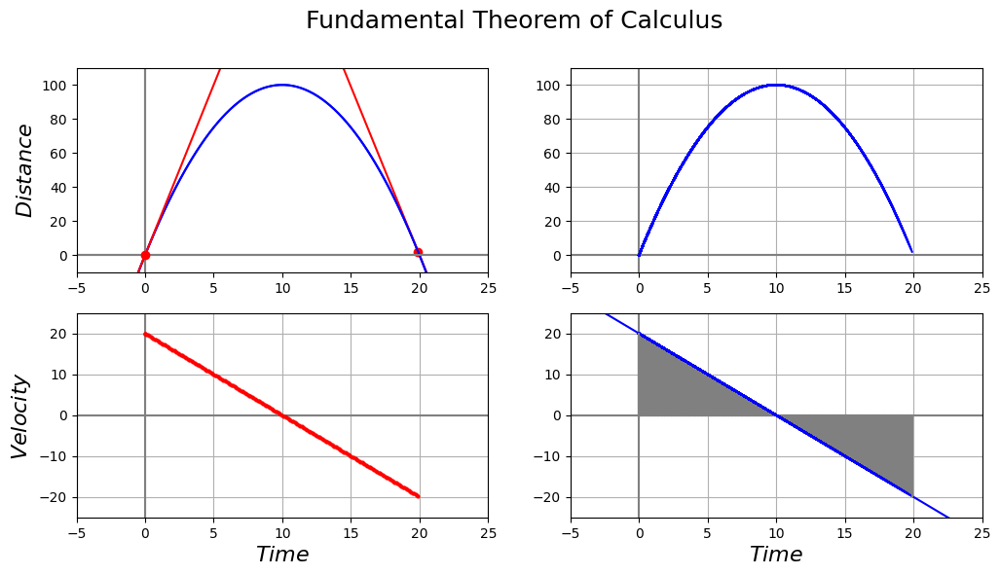

In [28]:
fig = plt.figure(figsize=(12,6))
fig.suptitle('Fundamental Theorem of Calculus', fontsize=18)

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

ax1.grid()
ax2.grid()
ax3.grid()
ax4.grid()

ax1.set_xlim(-5, 25)
ax2.set_xlim(-5, 25)
ax3.set_xlim(-5, 25)
ax4.set_xlim(-5, 25)

ax1.set_ylim(-10, 110)
ax2.set_ylim(-10, 110)
ax3.set_ylim(-25, 25)
ax4.set_ylim(-25, 25)

ax1.axhline(0, color='gray')
ax1.axvline(0, color='gray')
ax2.axhline(0, color='gray')
ax2.axvline(0, color='gray')
ax3.axhline(0, color='gray')
ax3.axvline(0, color='gray')
ax4.axhline(0, color='gray')
ax4.axvline(0, color='gray')

ax1.set_ylabel('$Distance$', fontsize=16)
ax3.set_xlabel('$Time$', fontsize=16)
ax3.set_ylabel('$Velocity$', fontsize=16)
ax4.set_xlabel('$Time$', fontsize=16)

t = np.linspace(-5, 25, 100)

s = -t*(t - 20)
v = -2*t + 20

ax1.plot(t, s, 'b')  
ax4.plot(t, v, 'b')


def update(time):
    if time!=0:
        ax1.cla()
        
    ax1.plot(t, s, 'b')                              # original function
    ax1.grid()
    ax1.axvline(0, color='gray')
    ax1.axhline(0, color='gray')
    ax1.set_xlim(-5, 25)
    ax1.set_ylim(-10, 110)
    ax1.set_ylabel('$Distance$', fontsize=16)
    
    ttime = time/10                                   # point of expansion
    v_time = -2*ttime + 20                            # f'(a)
    s_time = -ttime*(ttime - 20)                      # f(a)
    s1 = s_time + v_time*(t - ttime)                  # f(x) = f(a) + f'(a) (x-a)
    
    ax1.plot(t, s1, 'r')                              # plot tangent line
    ax1.plot(ttime, s_time, 'o', color='r')           # dot at the point of expansion
    ax3.plot(ttime, v_time, 'o', color='r', ms=2)     # derivative at the point
    
    
    ti = np.linspace(0, time, time+1)
    vi = -2*ti/10 + 20
    si = -(ti/10)**2 + 20*ti/10
    
    ax4.plot(ti/10, vi, color='blue')
    ax4.plot([ti[time]/10, ti[time]/10], [0, vi[time]], color='gray')
    ax2.plot(ti/10, si, 'b')
    
    

ani5 =  animation.FuncAnimation(fig, update, frames=200, interval=100)
HTML(ani5.to_jshtml())

### 直線の方程式
固定点：$(x_1, y_1)$  
移動点：$(x_2, y_2)$
### $$ \frac{y_2-y_1}{x_2-x_1} = \frac{y-y_1}{x-x_1}$$　
### $$ y = \frac{y_2-y_1}{x_2-x_1}(x-x_1) + y_1$$

### ２次関数の場合
### $ s = x^2 $
### $ \quad y_1 = x_1^{2} \\ \quad y_2 = x_2^{2} \\ \qquad x_2 = x_1 + \Delta x \\ \quad y_2 = (x_1 + \Delta x)^2 \\ \quad y_2 = x_1^{2} + 2x_1 \Delta x + \Delta x ^2 $

### $$ \begin{align} y &= \frac{2x_1 \Delta x + \Delta x ^2}{\Delta x}(x - x_1) + y_1 \\ y &= (2x_1 + \Delta x) (x - x_1) + y_1 \end{align}$$

### $ \Delta x \rightarrow 0$  
### $$ y = 2x_1 (x - x_1) + x_1^2$$

### 接線の傾き
### $$ slope = \frac{y_2 - y_1}{x_2 - x_1} = \frac{y_2-y_1}{\Delta x}$$  
### $ \Delta x \rightarrow 0$

### Python: $dx = \Delta x$ 

In [2]:
import sympy as smp

In [73]:
x1, dx = smp.symbols('x1, dx')

### $$y = x^2$$

In [74]:
y1 = x1**2
y1

x1**2

In [75]:
y2 = (x1 + dx)**2
y2

(dx + x1)**2

In [76]:
smp.expand(y2 - y1)

dx**2 + 2*dx*x1

In [77]:
y =smp.expand((y2 - y1)/dx)
y

dx + 2*x1

In [78]:
smp.limit(y, dx, 0)

2*x1

### $$y = x^3$$

In [ ]:
y1 = x1**3
y2 = (x1 + dx)**3
y = smp.expand((y2 - y1)/dx)
smp.limit(y, dx, 0)

### $$ y = x^4$$

In [ ]:
y1 = x1**4
y2 = (x1 + dx)**4
y = smp.expand((y2 - y1)/dx)
smp.limit(y, dx, 0)

### $$ y = x^5 $$

In [49]:
y1 = x1**5
y2 = (x1 + dx)**5
y = smp.expand((y2 - y1)/dx)
smp.limit(y, dx, 0)

5*x1**4

In [50]:
y1 = x1**5
y1

x1**5

In [51]:
y2 = (x1 + dx)**5
smp.expand(y2)

dx**5 + 5*dx**4*x1 + 10*dx**3*x1**2 + 10*dx**2*x1**3 + 5*dx*x1**4 + x1**5

In [52]:
smp.expand(y2 - y1)

dx**5 + 5*dx**4*x1 + 10*dx**3*x1**2 + 10*dx**2*x1**3 + 5*dx*x1**4

In [53]:
y = smp.expand((y2 - y1)/dx)
y

dx**4 + 5*dx**3*x1 + 10*dx**2*x1**2 + 10*dx*x1**3 + 5*x1**4

In [54]:
smp.limit(y, dx, 0)

5*x1**4

#### 次数と係数の関係
#### $ (x_1+dx)^5 = (x_1+dx)(x_1+dx)(x_1+dx)(x_1+dx)(x_1+dx) $

### 接線が作る関数

### $\begin{align} y = x \quad &\Rightarrow \quad slope = 1 \\ y = x^2 \quad &\Rightarrow \quad slope = 2x_1 \\ y = x^3 \quad &\Rightarrow \quad slope = 3x_1^2 \\ y = x^4 \quad &\Rightarrow \quad slope = 4x_1^3 \\ y = x^5 \quad &\Rightarrow \quad slope = 5x_1^4 \\ \cdots \\ y = x^k \quad &\Rightarrow \quad slope = kx_1^{k-1} \end{align}$

### 面積が作る関数

###  $\begin{align} y = m \quad &\Rightarrow \quad area = mb \\ y = mx \quad &\Rightarrow \quad area=\frac{m}{2}b^2 \\ y = mx^2 \quad &\Rightarrow \quad area=\frac{m}{3}b^3 \\ y = mx^3 \quad &\Rightarrow \quad area = \frac{m}{4}b^4 \\ y = mx^4 \quad &\Rightarrow \quad area = \frac{m}{5}b^5 \\ \cdots \\ y=mx^{k-1} \quad &\Rightarrow \quad area = \frac{m}{k}b^k \\ y= mx^k \quad &\Rightarrow \quad area=\frac{m}{k+1}b^{k+1} \end{align}$  

### 『いってこい』
### $$ y= x^3 -30x^2 + 200x $$

### $$ slope = (3x^2) -30(2x) + 200 $$

### $$ area = \biggl( \frac{3}{3}b^3 \biggr) -30 \biggl( \frac{2}{2}b^2 \biggr) + 200\biggl( b \biggr) $$

### Notation（表記方法） :

### $$ slope = \frac{dy}{dx} \qquad ^{c.f.}\quad 速度 = \frac{移動距離}{時間}$$

### $$ area = \int_0^b (slope) \,dx \qquad ^{c.f.}\quad 移動距離 = 速度×時間 $$

### Terminology（用語） :

### $\qquad$ Derivative : 微分係数、導関数
### $\qquad$ Differentiate : 微分する

### $\qquad $Integral : 積分
### $\qquad $Integrate : 積分する

### Python Commands :

In [29]:
x, b = smp.symbols('x b')

### $$y = x^3 - 30x^2 + 200x$$

In [30]:
y = x**3 - 30*x**2 + 200*x
y

x**3 - 30*x**2 + 200*x

### $$ slope = \frac{dy}{dx}$$

In [31]:
slope = smp.diff(y, x)
slope

3*x**2 - 60*x + 200

### $$ area = \int_0^b (slope) \, dx$$

In [32]:
area = smp.integrate(slope, (x, 0, b))
area

b**3 - 30*b**2 + 200*b

### Fundamental Theorem of Calculus（微積分学の基本定理）

### $y = x^3 - 30x^2 + 200x$

### $ \begin{align} slope &= \frac{dy}{dx} \\ slope &= 3x^2 - 60x + 200 \end{align}$

### $$\begin{align} slope &= 3x^2 - 60x + 200 \\ \\ \int_0^b (slope)\, dx &= \int_0^b\, 3x^2 - 60x + 200 \,dx \\ &= b^3 - 30b^2 + 200b \\ \\ \frac{d}{db} \int_0^b (slope)\, dx &= \frac{d}{db} (b^3 - 30b^2 + 200b) \\ \\ \frac{d}{db} \int_0^b (slope)\, dx &= 3b^2 - 60b + 200  \end{align}$$